In [1]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np
import ast

from lib.functions_data import *

In [2]:
import sys
from pathlib import Path
import os
cwd = os.getcwd()
parent = str(Path(cwd).parents[0])
sys.path.append(parent)

%matplotlib inline
%load_ext autoreload
%autoreload 2

To avoid pulling the full dataset down each time we re-run the notebook, a CSV of the cut-down dataset is saved for easier reloading.

In [65]:
#Checking for the cut of the full dataset and creating it if it doesn't exist:
try:
    dec = pd.read_csv(parent + '/data/jul22_euctr_extract.csv').drop('Unnamed: 0', axis=1)
except FileNotFoundError:
    cols = ['eudract_number_with_country', 'date_of_competent_authority_decision', 
            'clinical_trial_type', 'national_competent_authority', 'eudract_number',
            'date_on_which_this_record_was_first_entered_in_the_eudract_data',
            'trial_status', 'date_of_the_global_end_of_the_trial', 'trial_results']

    #You can use this URL if you want to download the full raw data
    data_link = 'https://www.dropbox.com/s/4qt0msiipyn7crm/euctr_euctr_dump-2020-12-03-095517.csv.zip?dl=1'

    dec = pd.read_csv(data_link, compression='zip', low_memory=False, usecols=cols)
    dec.to_csv(parent + '/data/dec_euctr_extract.csv')

#This is additional data we collect from the results page we need for certain analyses
results_info = pd.read_csv(parent + '/data/euctr_data_quality_results_scrape_jul_2022.csv')
results_info['trial_start_date'] = pd.to_datetime(results_info.trial_start_date)

In [4]:
#Quick look at the spread of trial statuses on the EUCTR
dec.trial_status.value_counts(dropna=False)

Completed                   63502
Ongoing                     27293
Prematurely Ended           12966
NaN                          2960
GB - no longer in EU/EEA     2797
Temporarily Halted            520
Restarted                     332
Not Authorised                 76
Prohibited by CA               37
Suspended by CA                23
Trial now transitioned          6
Name: trial_status, dtype: int64

The "date_of_competent_authority_decision" field has 2 nonsensical year values in which the correct value can reasonably be derived from context. We fix those below:

https://www.clinicaltrialsregister.eu/ctr-search/trial/2009-016759-22/DK

https://www.clinicaltrialsregister.eu/ctr-search/trial/2006-006947-30/FR

In [5]:
ind = dec[dec.date_of_competent_authority_decision.notnull() & 
          dec.date_of_competent_authority_decision.str.contains('210')].index
ind = ind.to_list()[0]

ind_2 = dec[dec.date_of_competent_authority_decision.notnull() & 
            dec.date_of_competent_authority_decision.str.contains('2077')].index
ind_2 = ind_2.to_list()[0]

dec.at[ind, 'date_of_competent_authority_decision'] = '2010-06-18'
dec.at[ind_2, 'date_of_competent_authority_decision'] = '2007-04-05'

In [6]:
#get rid of all protocols from non EU/EEA countries
dec_filt = dec[dec.clinical_trial_type != 'Outside EU/EEA'].reset_index(drop=True)

#lets see how many that is:
print(len(dec) - len(dec_filt))

1522


In [7]:
dec_ctas = dec[['eudract_number', 'eudract_number_with_country']].groupby('eudract_number').count()['eudract_number_with_country']

print(f'There are {len(dec_ctas)} registered trials and {dec_ctas.sum()} CTAs including non-EU/EEA CTAs')

There are 42369 registered trials and 110512 CTAs including non-EU/EEA CTAs


In [8]:
decf_ctas = dec_filt[['eudract_number', 'eudract_number_with_country']].groupby('eudract_number').count()['eudract_number_with_country']

print(f'There are {len(decf_ctas)} registered trials and {decf_ctas.sum()} CTAs excluding non-EU/EEA CTAs')

There are 41243 registered trials and 108990 CTAs excluding non-EU/EEA CTAs


In [9]:
#Making dates into dates and adding a column of just the "Year" for relevant dates

dec_filt['date_on_which_this_record_was_first_entered_in_the_eudract_data'] = pd.to_datetime(dec_filt['date_on_which_this_record_was_first_entered_in_the_eudract_data'])
dec_filt['entered_year'] = dec_filt['date_on_which_this_record_was_first_entered_in_the_eudract_data'].dt.year

dec_filt['date_of_competent_authority_decision'] = pd.to_datetime(dec_filt['date_of_competent_authority_decision'])
dec_filt['approved_year'] = dec_filt['date_of_competent_authority_decision'].dt.year

In [10]:
#Creating a copy of the original dataset we can mess with and
#renaming columns to better variable names

analysis_df = dec_filt.copy()
analysis_df.columns = ['eudract_number_country', 
                       'approved_date', 
                       'clinical_trial_type', 
                       'nca', 
                       'eudract_number', 
                       'date_entered', 
                       'trial_status', 
                       'completion_date', 
                       'trial_results', 
                       'entered_year', 
                       'approved_year']

#And update the NCA names to the more accurate recent names

analysis_df['nca'] = analysis_df['nca'].replace(nca_name_mapping)

In [11]:
#Table 1
analysis_df[['nca', 'eudract_number_country']].groupby('nca').count()

,eudract_number_country
nca,
Austria - BASG,4440
Belgium - FAMHP,6265
Bulgaria - BDA,2254
Croatia - MIZ,458
Cyprus - MoH-Ph.S,19
Czechia - SUKL,4687
Denmark - DKMA,4561
Estonia - SAM,1051
Finland - FIMEA,2702


In [12]:
#You can reproduce the data on the earliest registered protocol for each country by running this cell
#with the appropriate country abbreviation. For example, to get the date for Italy:

print(earliest_record_check(analysis_df, 'Italy - AIFA'))

#Uncomment this to get the date for all countries at once
#for abrev in country_abrevs.keys():
#    print(f'Country: {abrev}\nEarliest record date: {earliest_record_check(dec_filt, abrev)}')

2004-07-16


In [13]:
#lastly this is helpful to have the country names in various orders
ordered_countries_original = list(dec_filt.national_competent_authority.value_counts().index)
ordered_countries_new = list(analysis_df.nca.value_counts().index)

# Registrations Over Time

In [14]:
reg_df = analysis_df[['eudract_number', 'nca', 'date_entered', 'entered_year', 'approved_date', 'approved_year']].reset_index(drop=True)
reg_df.head()

,eudract_number,nca,date_entered,entered_year,approved_date,approved_year
0,2020-004353-80,Finland - FIMEA,2020-12-07,2020,2021-01-04,2021.0
1,2008-006344-19,Czechia - SUKL,2009-05-05,2009,2009-06-15,2009.0
2,2011-004581-14,Germany - BfArM,2012-03-29,2012,2012-04-16,2012.0
3,2010-021638-72,Italy - AIFA,2012-01-23,2012,2011-06-21,2011.0
4,2019-002880-82,UK - MHRA,2020-06-02,2020,2020-05-05,2020.0


In [15]:
#Data for Overall Trend in Registrations

grouped_overall = reg_df[['eudract_number']].groupby([reg_df.entered_year]).count()
earliest_entered = reg_df[['eudract_number', 'date_entered']].groupby('eudract_number', as_index=False).min()
earliest_entered['year'] = earliest_entered.date_entered.dt.year
unique_trials = earliest_entered[['eudract_number', 'year']].groupby('year').count()

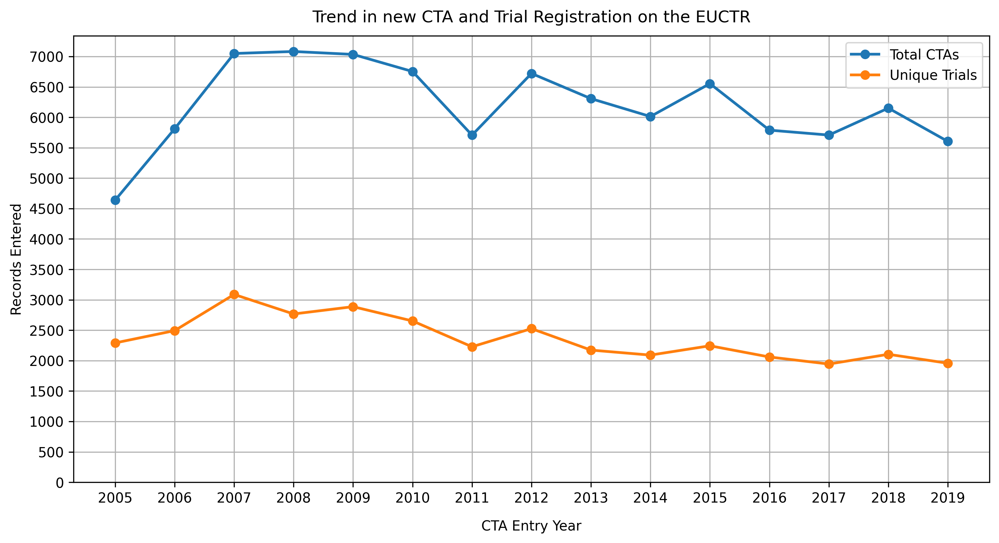

In [16]:
fig, ax = plt.subplots(figsize = (12,6), dpi=300)

grouped_overall[(grouped_overall.index > 2004) & (grouped_overall.index < 2020)].plot(ax=ax, legend=False, lw=2, 
                                                                                      marker='.', markersize=12)
unique_trials[(unique_trials.index > 2004) & (unique_trials.index < 2020)].plot(ax=ax, legend=False, grid=True, 
                                                                                lw=2, marker='.', markersize=12)

ax.legend(['Total CTAs', 'Unique Trials'], bbox_to_anchor = (1, 1))
ax.set_xticks(range(2005, 2020))
ax.set_yticks(range(0,7500, 500))
plt.xlabel('CTA Entry Year', labelpad=10)
plt.ylabel('Records Entered')
plt.title('Trend in new CTA and Trial Registration on the EUCTR', pad=10)

#fig.savefig(parent + '/data/Figures/fig1.jpg', bbox_inches='tight', dpi=300)
fig.show()

Now we're interested in breaking the data down a bit further. Here we will break it down into quarters and years for more detailed analysis. We graph the years for which we have full EUCTR data (2005-2019).

In [17]:
grouped = reg_df[['eudract_number']].groupby([reg_df.nca, pd.PeriodIndex(reg_df.date_entered, freq='Q')]).count()

get_index = reg_df[['eudract_number']].groupby(pd.PeriodIndex(reg_df.date_entered, freq='Q')).count()
quarters = list(get_index.index)

In [18]:
grouped_2 = reg_df[['eudract_number']].groupby([reg_df.nca, pd.PeriodIndex(reg_df.date_entered, freq='Y')]).count()

get_index = reg_df[['eudract_number']].groupby(pd.PeriodIndex(reg_df.date_entered, freq='Y')).count()
years = list(get_index.index)

In [19]:
grouped_year = reg_df[['eudract_number']].groupby([reg_df.nca, reg_df.entered_year]).count()
grouped_year_2 = reg_df[['eudract_number']].groupby([reg_df.nca, reg_df.approved_year]).count()

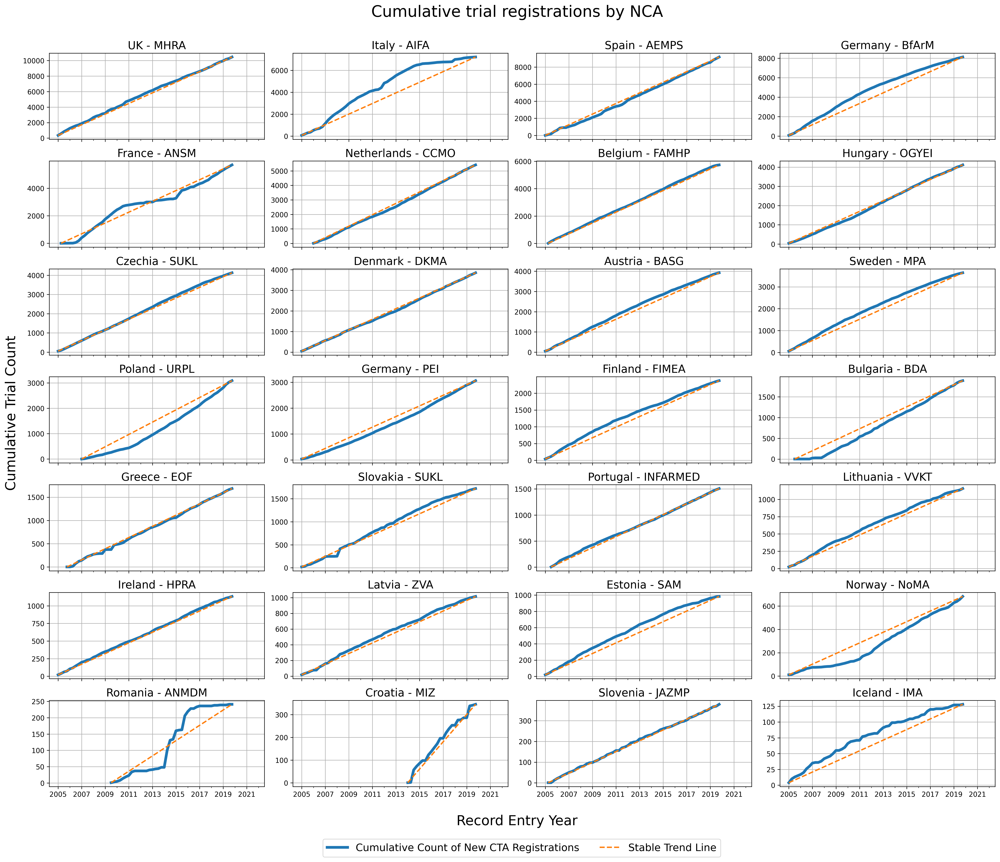

In [20]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Cumulative trial registrations by NCA", y=1.02, fontsize=23)
fig.tight_layout()

pd.set_option('mode.chained_assignment', None)
for x, y in enumerate(fig.axes):
    country = grouped.loc[ordered_countries_new[x]]
    first_reporting_quarter = country[country.eudract_number > 0].index.min()
    adjusted_data = zero_out_dict(country.to_dict()['eudract_number'], quarters) 
    data = pd.DataFrame({'eudract_number': adjusted_data})
    x_ticks = data.index
    
    #Get rid of leading zeros
    data['eudract_number'] = np.where(data.index < first_reporting_quarter, np.nan, data.eudract_number)
    
    consolidated = data[(data.index.year > 2004) & (data.index.year < 2020) & data.eudract_number.notnull()]
    
    leading_zero_check = True
    i=0
    
    while leading_zero_check:
        if consolidated.eudract_number[i] == 0:
            consolidated.at[consolidated.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    consolidated = consolidated[consolidated.eudract_number.notnull()]
    
    cumulative = consolidated.cumsum()
    
    # Plotting the country trend
    cumulative.plot(ax=y, lw=4, sharex='col',legend=False)
    
    #Plotting the reference line
    cumulative.loc[[cumulative.index[0], cumulative.index[-1]]].plot(ax=y, legend=False, lw=2, style='--')
    
    y.set_title(ordered_countries_new[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(zorder=0)
    y.set_xlabel('')
    y.set_xlim(x_ticks[0], x_ticks[-1])
    
pd.set_option('mode.chained_assignment', 'warn')

fig.text(-0.015, 0.5, 'Cumulative Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.legend(['Cumulative Count of New CTA Registrations', 'Stable Trend Line'], 
           loc='upper center', ncol=5, bbox_to_anchor = (-1.2, -.55), fontsize=15)
plt.show()
#fig.savefig(parent + '/data/Figures/fig2.jpg', bbox_inches='tight', dpi=300)

For comparison here are the raw trends in new registrations by quarter

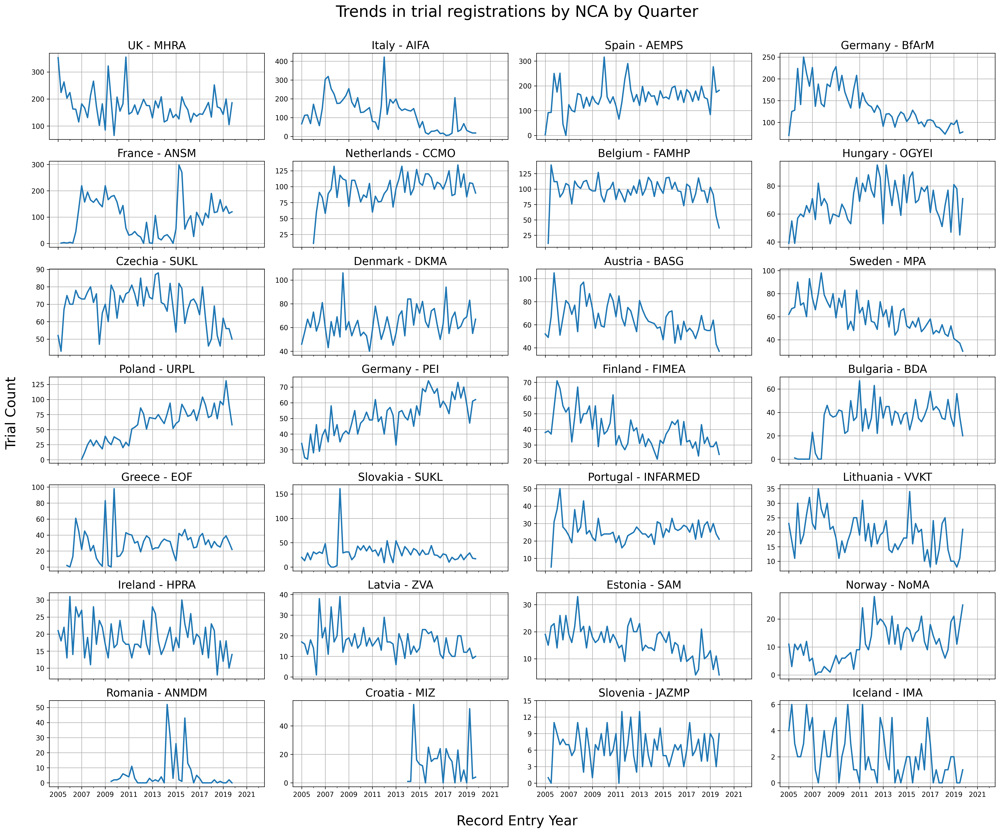

In [21]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Trends in trial registrations by NCA by Quarter", y=1.02, fontsize=23)
fig.tight_layout()

pd.set_option('mode.chained_assignment', None)
for x, y in enumerate(fig.axes):
    country = grouped.loc[ordered_countries_new[x]]
    first_reporting_quarter = country[country.eudract_number > 0].index.min()
    adjusted_data = zero_out_dict(country.to_dict()['eudract_number'], quarters) 
    data = pd.DataFrame({'eudract_number': adjusted_data})
    x_ticks = data.index
    
    #Get rid of leading zeros
    data['eudract_number'] = np.where(data.index < first_reporting_quarter, np.nan, data.eudract_number)
    
    consolidated = data[(data.index.year > 2004) & (data.index.year < 2020) & data.eudract_number.notnull()]
    
    leading_zero_check = True
    i=0
    
    while leading_zero_check:
        if consolidated.eudract_number[i] == 0:
            consolidated.at[consolidated.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    consolidated = consolidated[consolidated.eudract_number.notnull()]
    
    consolidated.plot(ax=y, lw=2, sharex='col',legend=False)
    
    if ordered_countries_original[x] == 'Slovenia - JAZMP':
        y.set_yticks(range(0,16,3))
    
    y.set_title(ordered_countries_new[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(zorder=0)
    y.set_xlabel('')
    y.set_xlim(x_ticks[0], x_ticks[-1])
    
pd.set_option('mode.chained_assignment', 'warn')

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.show()
#fig.savefig(parent + '/data/Figures/sfig1.jpg', bbox_inches='tight', dpi=300)

Lasty, we can sense check that these dates make sense by comparing the year the CTA was entered to the date the NCA gave approval. When we graph them on top of each other, we can see that the overall trend align very well though with approvals being slightly less susceptable to large jumps.

In [22]:
grouped_year = reg_df[['eudract_number']].groupby([reg_df.nca, reg_df.entered_year]).count()
grouped_year_2 = reg_df[['eudract_number']].groupby([reg_df.nca, reg_df.approved_year]).count()

Here is the trend by year, not quarter, but we do not include this graph in the paper as it is duplicated in the next graph.

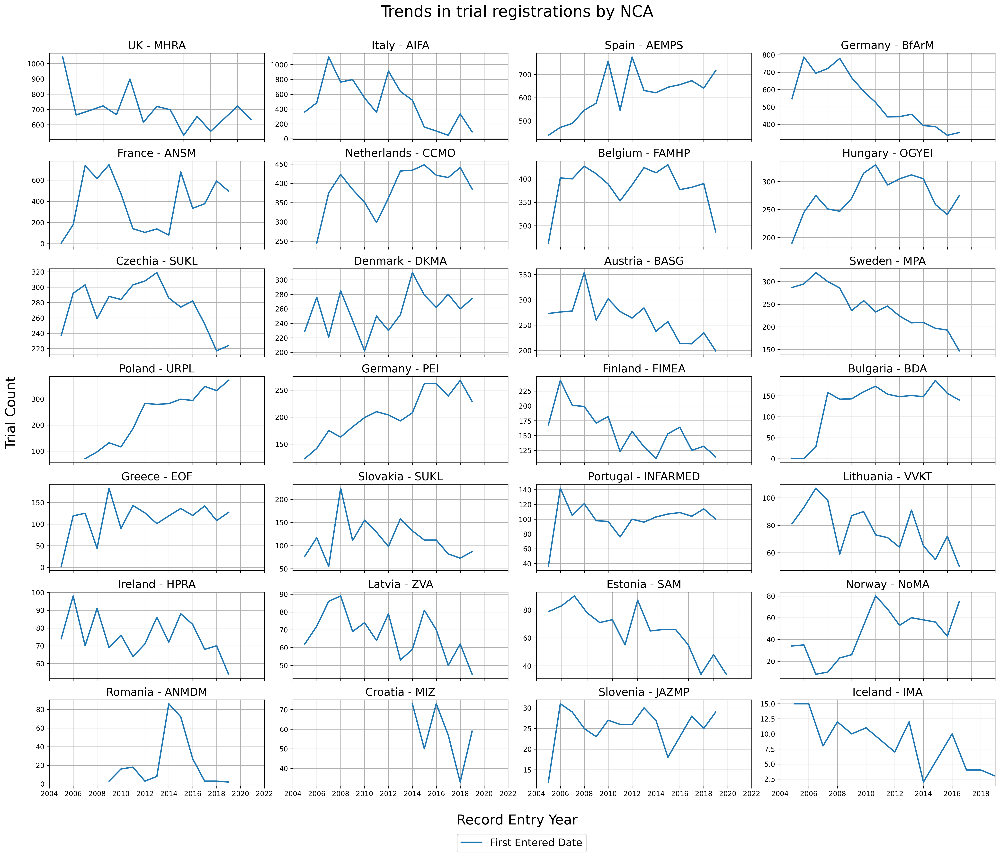

In [23]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Trends in trial registrations by NCA", y=1.02, fontsize=23)
fig.tight_layout()

pd.set_option('mode.chained_assignment', None)
for x, y in enumerate(fig.axes):
    country = grouped_year.loc[ordered_countries_new[x]]
    first_reporting_quarter = country[country.eudract_number > 0].index.min()
    
    adjusted_data = zero_out_dict(country.to_dict()['eudract_number'], range(2004, 2020))
    
    data = pd.DataFrame({'eudract_number': adjusted_data})
    x_ticks = data.index
    
    #Get rid of leading zeros
    data['eudract_number'] = np.where(data.index < first_reporting_quarter, np.nan, data.eudract_number)
    
    consolidated = data[(data.index > 2004) & (data.index < 2020) & data.eudract_number.notnull()]
    
    leading_zero_check = True
    i=0
    
    while leading_zero_check:
        if consolidated.eudract_number.values[i] == 0:
            consolidated.at[consolidated.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    
    consolidated = consolidated[consolidated.eudract_number.notnull()]
    
    consolidated.plot(ax=y, lw=2, sharex='col',legend=False)
    
    y.set_title(ordered_countries_new[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(zorder=0)
    y.set_xlabel('')
    y.set_xlim(x_ticks[0], x_ticks[-1])
    
pd.set_option('mode.chained_assignment', 'warn')

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.legend(['First Entered Date', 'NCA Approval Date'], 
           loc='upper center', ncol=5, bbox_to_anchor = (-1.2, -.5), fontsize=15)
plt.show()

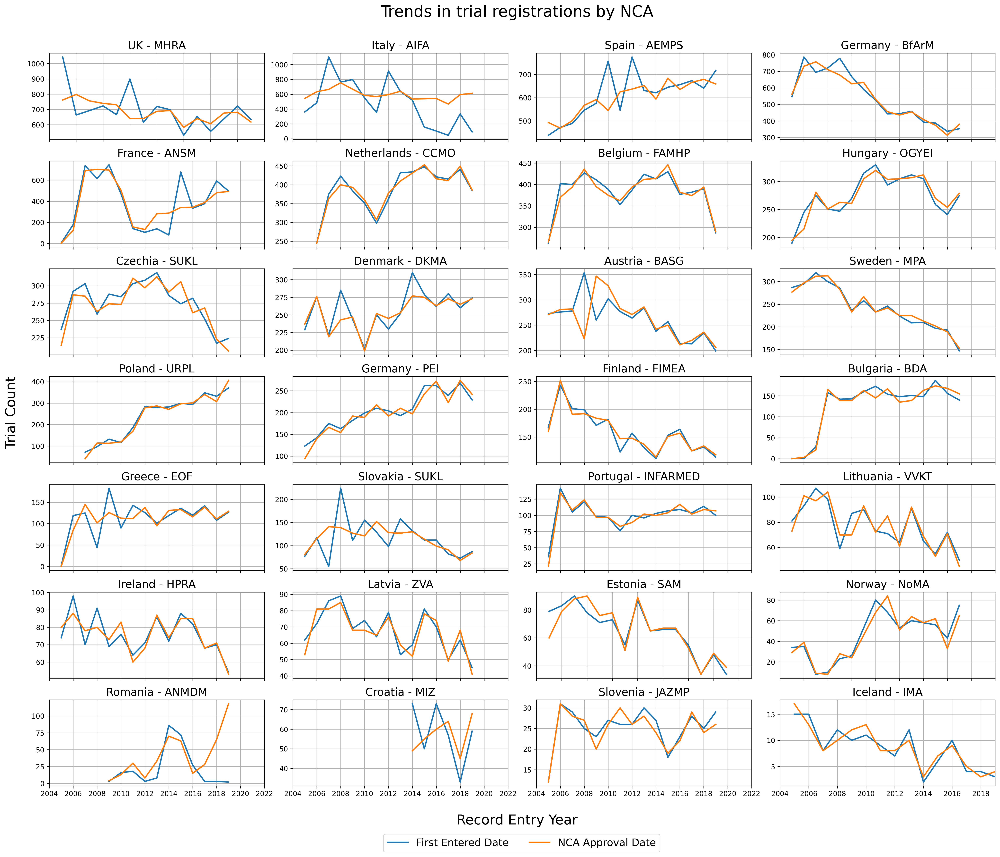

In [24]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Trends in trial registrations by NCA", y=1.02, fontsize=23)
fig.tight_layout()

pd.set_option('mode.chained_assignment', None)
for x, y in enumerate(fig.axes):
    country = grouped_year.loc[ordered_countries_new[x]]
    country_2 = grouped_year_2.loc[ordered_countries_new[x]]
    first_reporting_quarter = country[country.eudract_number > 0].index.min()
    
    adjusted_data = zero_out_dict(country.to_dict()['eudract_number'], range(2004, 2020))
    adjusted_data_2 = zero_out_dict(country_2.to_dict()['eudract_number'], range(2004, 2020))
    
    data = pd.DataFrame({'eudract_number': adjusted_data})
    data_2 = pd.DataFrame({'eudract_number': adjusted_data_2})
    x_ticks = data.index
    
    #Get rid of leading zeros
    data['eudract_number'] = np.where(data.index < first_reporting_quarter, np.nan, data.eudract_number)
    data_2['eudract_number'] = np.where(data_2.index < first_reporting_quarter, np.nan, data_2.eudract_number)
    
    consolidated = data[(data.index > 2004) & (data.index < 2020) & data.eudract_number.notnull()]
    consolidated_2 = data_2[(data_2.index > 2004) & (data_2.index < 2020) & data_2.eudract_number.notnull()]
    
    leading_zero_check = True
    i=0
    
    while leading_zero_check:
        if consolidated.eudract_number.values[i] == 0:
            consolidated.at[consolidated.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    while leading_zero_check:
        if consolidated_2.eudract_number.values[i] == 0:
            consolidated_2.at[consolidated_2.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    consolidated = consolidated[consolidated.eudract_number.notnull()]
    consolidated_2 = consolidated_2[consolidated_2.eudract_number.notnull()]
    
    consolidated.plot(ax=y, lw=2, sharex='col',legend=False)
    consolidated_2.plot(ax=y, lw=2, sharex='col',legend=False)
    
    y.set_title(ordered_countries_new[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(zorder=0)
    y.set_xlabel('')
    y.set_xlim(x_ticks[0], x_ticks[-1])

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)
    
pd.set_option('mode.chained_assignment', 'warn')
plt.legend(['First Entered Date', 'NCA Approval Date'], 
           loc='upper center', ncol=5, bbox_to_anchor = (-1.2, -.5), fontsize=15)
plt.show()
#fig.savefig(parent + '/data/Figures/sfig2.jpg', bbox_inches='tight', dpi=300)

# Cross-checking countries listed in results with public CTAs

In [66]:
results_info_filt = results_info[results_info.recruitment_countries.notnull()].reset_index(drop=True)

In [67]:
protocols = results_info_filt.trial_countries.to_list()
results_countries = results_info_filt.recruitment_countries.to_list()
start_date = results_info_filt.trial_start_date.to_list()
trial_ids = results_info_filt.trial_id.to_list()

zipped_cats = zip(trial_ids, protocols, results_countries, start_date)

results_list = compare_enrollment_registration(zipped_cats)

missing_protocols = pd.DataFrame(results_list)
missing_protocols['total_missing'] = missing_protocols.unaccounted.apply(len)

In [68]:
acct = missing_protocols.accounted.to_list()
unacct = missing_protocols.unaccounted.to_list()

In [69]:
accounted_count = {}
unaccounted_count = {}
for ac, un in zip(acct, unacct):
    if ac:
        for a in ac:
            accounted_count[a] = accounted_count.get(a, 0) + 1
    if un:
        for u in un:
            unaccounted_count[u] = unaccounted_count.get(u, 0) + 1

In [70]:
accounted_series = pd.Series(accounted_count)
unaccounted_series = pd.Series(unaccounted_count)

reg_check_no_buffer = accounted_series.to_frame().join(unaccounted_series.to_frame(), how='outer', rsuffix='unac').rename({'0': 'accounted', '0unac': 'unaccounted'}, axis=1).fillna(0)

In [71]:
reg_check_no_buffer['total'] = reg_check_no_buffer['accounted'] + reg_check_no_buffer['unaccounted']

reg_check_no_buffer['acct_prct'] = round((reg_check_no_buffer['accounted'] / reg_check_no_buffer['total']) * 100, 2)

reg_check_no_buffer['unacct_prct'] = round((reg_check_no_buffer['unaccounted'] / reg_check_no_buffer['total']) * 100, 2)

reg_check_no_buffer.head()

,accounted,unaccounted,total,acct_prct,unacct_prct
Austria,1311,24,1335,98.20,1.80
Belgium,2233,79,2312,96.58,3.42
Bulgaria,1006,79,1085,92.72,7.28
Croatia,154,2,156,98.72,1.28
Cyprus,2,4,6,33.33,66.67


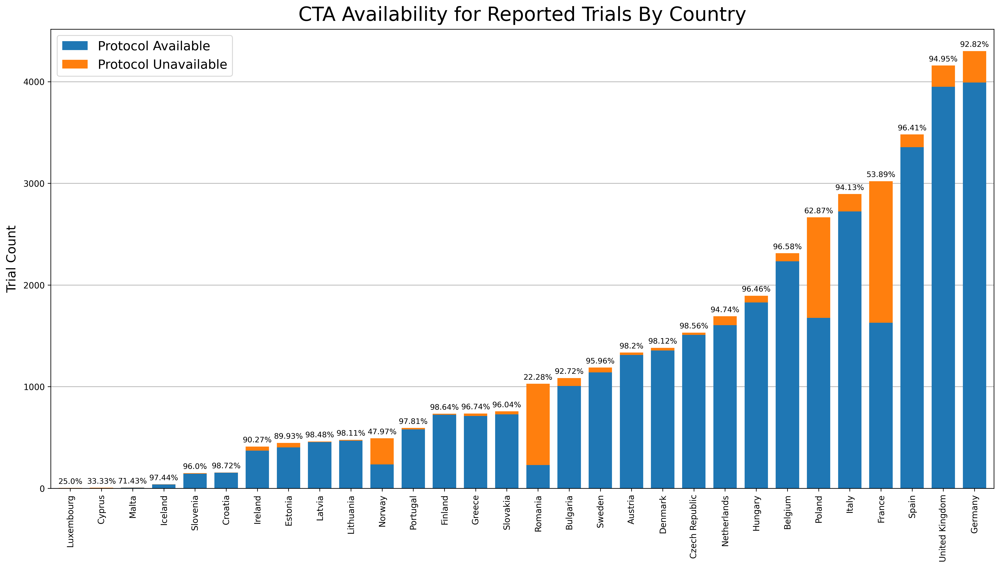

In [72]:
fig, ax = plt.subplots(figsize = (20,10), dpi=300)

title = 'CTA Availability for Reported Trials By Country'

sorted_countries = reg_check_no_buffer.sort_values(by='total')
sorted_countries[['accounted', 'unaccounted']].plot.bar(stacked=True, ax=ax,
                                                        legend=False, width=.75)

ax.set_axisbelow(True)
ax.grid(axis='y', zorder=0)

rects = ax.patches[0:30]

for rect, label, y_off in zip(rects, sorted_countries.acct_prct.values, sorted_countries.total.values):
    ax.text(rect.get_x() + rect.get_width() / 2, y_off + 25, str(label) + '%', 
            ha='center', va='bottom', fontsize=9)

ax.legend(['Protocol Available', 'Protocol Unavailable'], 
           loc='upper left', fontsize=15)
    

plt.title(title, pad=10, fontsize=23)

plt.ylabel('Trial Count', fontsize=15, labelpad=6)
    
plt.show()
#fig.savefig(parent + '/data/Figures/fig3.jpg', bbox_inches='tight', dpi=300)

In [73]:
min_start_date = analysis_df[['eudract_number', 'entered_year']].groupby('eudract_number', as_index=False).min()

by_year_df = missing_protocols.merge(min_start_date, how='left', left_on='trial_id', right_on='eudract_number').drop('eudract_number', axis=1)

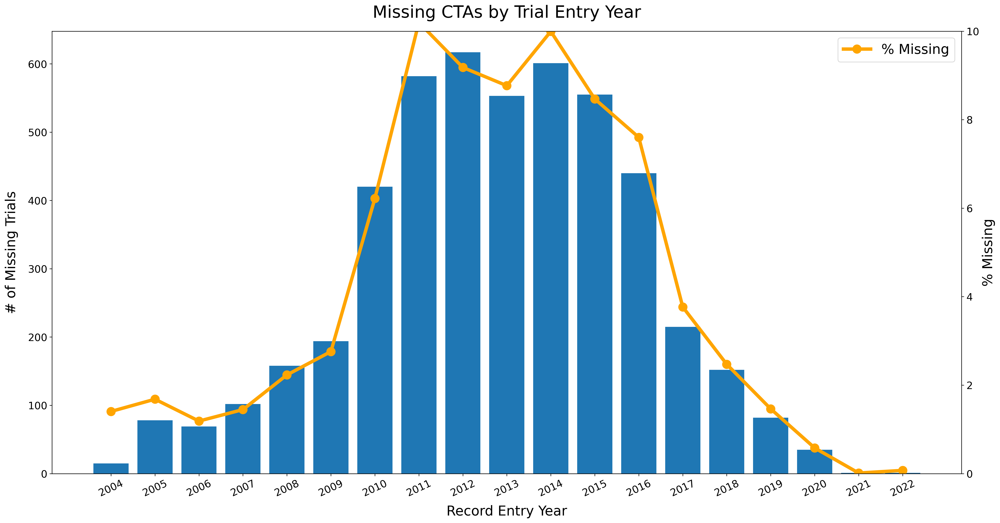

In [75]:
fig, ax = plt.subplots(figsize=(24,12), dpi = 300)

to_graph = by_year_df[['entered_year', 'total_missing']].groupby('entered_year').sum()
to_graph.index = to_graph.index.astype(int)

prct_missing = grouped_overall.join(to_graph)
prct_missing['missing_cta_prct'] = (prct_missing.total_missing / prct_missing.eudract_number) * 100

labels = [str(x) for x in range(2004,2023)]

#I have no idea why but I can only get this graph to work with plt.errorbar
#l1 = plt.errorbar(prct_missing.index,prct_missing.missing_cta_prct, lw=5, color='orange')
l1 = ax.plot(prct_missing.index,prct_missing.missing_cta_prct, marker='.', markersize=25, lw=5, color='orange', label='% Missing')

plt.tick_params(axis='both', which='major', labelsize=15)
#plt.ylabel('# of Missing Trials', fontsize=25, labelpad=10)
plt.xticks(rotation=25)
plt.title("Missing CTAs by Trial Entry Year", pad = 20, fontsize = 25)

ax.set_ylim([0,10])
ax.set_ylabel('# of Missing Trials', fontsize=20, labelpad=50)
ax.set_xlabel('Record Entry Year', fontsize=20, labelpad=10)

ax2 = plt.twinx()
ax2.set_axisbelow(True)
#ax.yaxis.grid(linestyle='--', linewidth=.5, zorder=ax.get_zorder()-10)
ax2.bar(to_graph.index, to_graph.total_missing, tick_label=labels)
ax2.tick_params(axis='both', which='major', labelsize=15)
ax2.set_ylabel('% Missing', fontsize=20, labelpad=30)

ax.yaxis.tick_right()
ax2.yaxis.tick_left()

ax.set_zorder(ax2.get_zorder()+1)
ax.patch.set_visible(False)

ax.legend(fontsize=20)

plt.show()
#fig.savefig(parent + '/data/Figures/fig4.jpg', bbox_inches='tight', dpi=300)

As a quick sense check, we can use longer lags between the first available protocol for a country to see if it makes a difference. This can be adjusted using the offseet parameter of the compare_enrollment_registration function. However, Figure 4 above makes the point that missing CTAs are not all clustered around the years in which countries first connected with the EMA system as well.

In [76]:
protocols = results_info_filt.trial_countries.to_list()
results_countries = results_info_filt.recruitment_countries.to_list()
start_date = results_info_filt.trial_start_date.to_list()
trial_ids = results_info_filt.trial_id.to_list()

zipped_cats = zip(trial_ids, protocols, results_countries, start_date)

results_sens = compare_enrollment_registration(zipped_cats, offset=6)

missing_sensitivity = pd.DataFrame(results_sens)

In [77]:
acct_sens = missing_sensitivity.accounted.to_list()
unacct_sens = missing_sensitivity.unaccounted.to_list()

accounted_count_sens = {}
unaccounted_count_sens = {}
for ac, un in zip(acct_sens, unacct_sens):
    if ac:
        for a in ac:
            accounted_count_sens[a] = accounted_count_sens.get(a, 0) + 1
    if un:
        for u in un:
            unaccounted_count_sens[u] = unaccounted_count_sens.get(u, 0) + 1
            
accounted_series_sens = pd.Series(accounted_count_sens)
unaccounted_series_sens = pd.Series(unaccounted_count_sens)

In [78]:
reg_check_buffer = accounted_series_sens.to_frame().join(unaccounted_series_sens.to_frame(), how='outer', rsuffix='unac').rename({'0': 'accounted', '0unac': 'unaccounted'}, axis=1).fillna(0)

reg_check_buffer['total'] = reg_check_buffer['accounted'] + reg_check_buffer['unaccounted']
reg_check_buffer['acct_prct'] = round((reg_check_buffer['accounted'] / reg_check_buffer['total']) * 100, 2)

reg_check_buffer.head()

,accounted,unaccounted,total,acct_prct
Austria,1303,23,1326,98.27
Belgium,2226,71,2297,96.91
Bulgaria,1000,78,1078,92.76
Croatia,136,1,137,99.27
Cyprus,2,4,6,33.33


In [79]:
reg_check_buffer

,accounted,unaccounted,total,acct_prct
Austria,1303,23,1326,98.27
Belgium,2226,71,2297,96.91
Bulgaria,1000,78,1078,92.76
Croatia,136,1,137,99.27
Cyprus,2,4,6,33.33
Czech Republic,1503,22,1525,98.56
Denmark,1352,25,1377,98.18
Estonia,402,45,447,89.93
Finland,721,8,729,98.90
France,1625,1369,2994,54.28


# Trial Status By Country Over Time

In [37]:
status_df = analysis_df[['eudract_number', 'nca', 'entered_year', 'trial_status']].reset_index(drop=True)
status_df['trial_status'] = status_df.trial_status.fillna('Missing')

status_group = status_df.groupby(['nca', 'entered_year', 'trial_status'], as_index=False).count()

In [38]:
ordered_countries = list(status_group[['nca', 'eudract_number']].groupby('nca').sum().sort_values(by='eudract_number', ascending=False).index)

#Removing these for low number of trials
ordered_countries.remove('Malta - ADM')
ordered_countries.remove('Luxembourg - Ministry of Health')
ordered_countries.remove('Cyprus - MoH-Ph.S')

Here we create our trial status categories

In [39]:
country_status = {}

for c in status_group.nca.unique():
    country_dict = {}
    country = status_group[status_group.nca == c]
    
    completed = country[country.trial_status.isin(['Completed', 'Prematurely Ended'])][['entered_year', 'eudract_number']].groupby('entered_year').sum()
    comp_dict = completed.to_dict()['eudract_number']
    country_dict['completed'] = zero_out_dict(comp_dict, range(2004,2021))
    
    ongoing = country[country.trial_status.isin(['Ongoing', 'Restarted'])][['entered_year', 'eudract_number']].groupby('entered_year').sum()
    ong_dict = ongoing.to_dict()['eudract_number']
    country_dict['ongoing'] = zero_out_dict(ong_dict, range(2004,2021))
    
    missing = country[country.trial_status == 'Missing']
    missing_dict = pd.Series(missing.eudract_number.values, index=missing.entered_year).to_dict()
    country_dict['missing'] = zero_out_dict(missing_dict, range(2004,2021))
    
    other = country[~country.trial_status.isin(['Completed', 'Ongoing', 'Restarted', 'Prematurely Ended', 'Missing'])][['entered_year', 'eudract_number']].groupby('entered_year').sum()
    other_dict = other.to_dict()['eudract_number']
    country_dict['other'] = zero_out_dict(other_dict, range(2004,2021))
    
    country_status[c] = country_dict

In [40]:
#Shaping up the final data so it's easy to use

regrouped = pd.DataFrame.from_dict(country_status, orient='index').stack().to_frame()[0].apply(pd.Series).reindex(
    ['completed', 'ongoing', 'other', 'missing'], level=1)

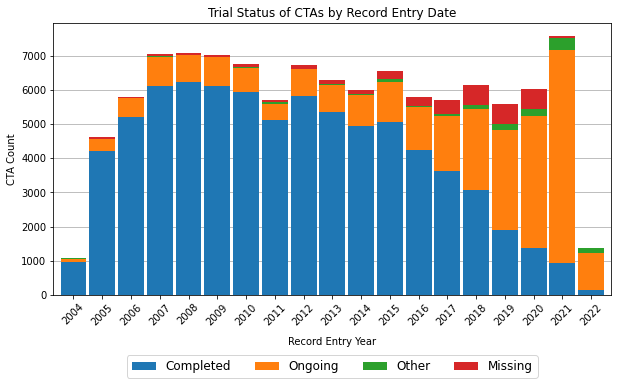

In [41]:
#A glance at the overall trend

grouped_total = regrouped.droplevel(level=0).groupby(regrouped.droplevel(level=0).index).sum()

title='Trial Status of CTAs by Record Entry Date'


fig, ax = plt.subplots(figsize = (10,5))
grouped_total.reindex(['completed', 'ongoing', 'missing', 'other']).T.plot.bar(stacked=True, width=.9, ax=ax, 
                                                                               rot=45, title = title, legend=False)

ax.set_axisbelow(True)
ax.grid(axis='y', zorder=0)
ax.set_xlabel('Record Entry Year', labelpad=10)
ax.set_ylabel('CTA Count')

plt.legend(['Completed', 'Ongoing', 'Other', 'Missing'], 
           loc='upper center', ncol=5, bbox_to_anchor = (0.5, -0.2), fontsize=12)
plt.show()
#fig.savefig(parent + '/data/Figures/sfig3.jpg', bbox_inches='tight', dpi=300)

In [42]:
overall_prct_dict = {}

for x in ordered_countries:
    g = regrouped.loc[[x]].droplevel(level=0).T.loc[2004:2016]
    num = g.completed.sum()
    denom = num + g.ongoing.sum() + g.missing.sum() + g.other.sum()
    overall_prct_dict[x] = num / denom
    print(x, num, denom, num/denom, '\n')

rankings_completed = pd.Series(overall_prct_dict).sort_values(ascending=False)
#rankings_completed

UK - MHRA 7538.0 8466.0 0.8903850696905268 

Italy - AIFA 5320.0 6774.0 0.7853557720696782 

Spain - AEMPS 5604.0 7265.0 0.7713695801789401 

Germany - BfArM 6597.0 7127.0 0.925634909499088 

France - ANSM 2913.0 4230.0 0.6886524822695036 

Netherlands - CCMO 2826.0 4173.0 0.6772106398274622 

Belgium - FAMHP 4006.0 4678.0 0.8563488670371954 

Hungary - OGYEI 3201.0 3468.0 0.9230103806228374 

Czechia - SUKL 3267.0 3534.0 0.9244482173174873 

Denmark - DKMA 2833.0 3098.0 0.9144609425435765 

Austria - BASG 3099.0 3387.0 0.9149689991142604 

Sweden - MPA 2719.0 3278.0 0.8294691885295912 

Poland - URPL 1887.0 2039.0 0.9254536537518392 

Germany - PEI 2149.0 2338.0 0.9191616766467066 

Finland - FIMEA 1746.0 2099.0 0.8318246784182944 

Bulgaria - BDA 1350.0 1406.0 0.9601706970128022 

Greece - EOF 1205.0 1308.0 0.9212538226299695 

Slovakia - SUKL 1443.0 1523.0 0.9474720945502298 

Portugal - INFARMED 1071.0 1190.0 0.9 

Lithuania - VVKT 1004.0 1027.0 0.9776046738072055 

Ireland - HPRA 

In [43]:
g.loc[2004:2015]

,completed,ongoing,other,missing
2004,5.0,0.0,0.0,0.0
2005,15.0,0.0,0.0,0.0
2006,13.0,2.0,0.0,0.0
2007,8.0,0.0,0.0,0.0
2008,12.0,0.0,0.0,0.0
2009,7.0,3.0,0.0,0.0
2010,9.0,2.0,0.0,0.0
2011,9.0,0.0,0.0,0.0
2012,7.0,0.0,0.0,0.0
2013,8.0,4.0,0.0,0.0


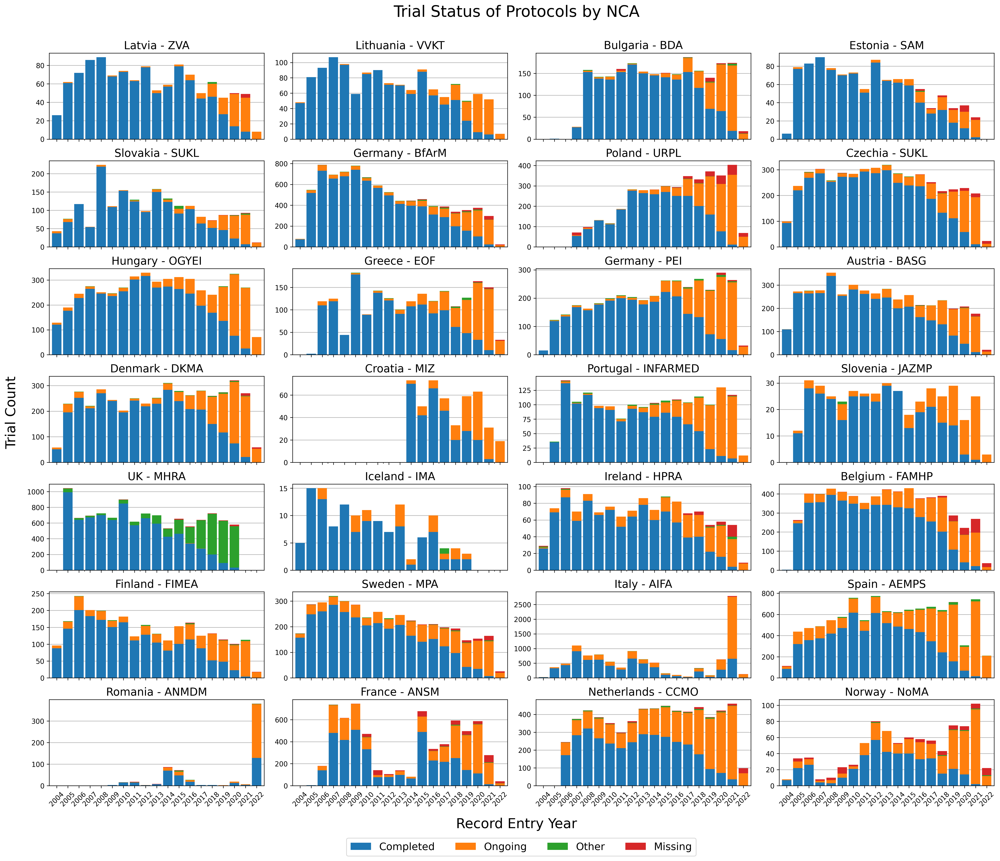

In [44]:
#And now a look at the trend for each NCA

fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Trial Status of Protocols by NCA", y=1.02, fontsize=23)
fig.tight_layout()
for x, y in enumerate(fig.axes):
    regrouped.loc[[rankings_completed.index[x]]].droplevel(level=0).T.plot.bar(stacked=True, ax=y, width=.85, 
                                                                               legend=False, sharex='col', rot=45)
    
    y.set_title(rankings_completed.index[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(axis='y', zorder=0)
    y.set_xlabel('')

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.025, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.legend(['Completed', 'Ongoing', 'Other', 'Missing'], 
           loc='upper center', ncol=5, bbox_to_anchor = (-1.2, -.55), fontsize=15)

plt.show()
#fig.savefig(parent + '/data/Figures/fig5.jpg', bbox_inches='tight', dpi=300)

# Missing Completion Dates

In [45]:
date_df = analysis_df[['eudract_number', 'nca', 'entered_year', 'trial_status', 'completion_date', 'trial_results']].reset_index(drop=True)
date_df['trial_status'] = date_df.trial_status.fillna('Missing')
date_df['has_completion_date'] = np.where(date_df.completion_date.isna(), 0, 1)

In [46]:
only_completed = date_df[date_df.trial_status.isin(['Completed', 'Prematurely Ended'])].reset_index(drop=True)

In [47]:
total_completed = only_completed[['nca', 
                                  'entered_year', 
                                  'has_completion_date']].groupby(['nca', 
                                                                   'entered_year']).count().rename({'has_completion_date': 'denominator'}, axis=1)

total_completed_date = only_completed[['nca', 'entered_year', 'has_completion_date']].groupby(['nca', 'entered_year']).sum().rename({'has_completion_date': 'numerator'}, axis=1)

In [48]:
merged_dates = total_completed.join(total_completed_date)
merged_dates['missing_dates'] = merged_dates.denominator - merged_dates.numerator

In [49]:
stacked_dates = merged_dates.drop('denominator', axis=1).stack().unstack(1)

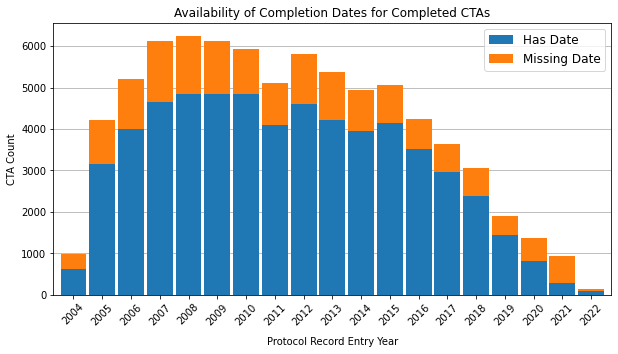

In [50]:
overall_dates = stacked_dates.droplevel(level=0).groupby(stacked_dates.droplevel(level=0).index).sum()

title='Availability of Completion Dates for Completed CTAs'

fig, ax = plt.subplots(figsize = (10,5))
overall_dates.reindex(['numerator', 'missing_dates']).T.plot.bar(stacked=True, width=.9, ax=ax, legend=False, 
                                                                 rot=45, title=title)

ax.set_axisbelow(True)
ax.grid(axis='y', zorder=0)
ax.set_xlabel('Protocol Record Entry Year', labelpad=10)
ax.set_ylabel('CTA Count')

plt.legend(['Has Date', 'Missing Date'], 
           loc='upper right', fontsize=12)
plt.show()
#fig.savefig(parent + '/data/Figures/sfig4.jpg', bbox_inches='tight', dpi=300)

In [51]:
overall_comp_dict = {}

for x in ordered_countries:
    d = stacked_dates.loc[x].T.loc[2004:2016]
    num = d.numerator.sum()
    denom = num + d.missing_dates.sum()
    overall_comp_dict[x] = num / denom
    print(x, num, denom, num/denom, '\n')

rankings_compdate = pd.Series(overall_comp_dict).sort_values(ascending=False)
#rankings_compdate

UK - MHRA 7333.0 7538.0 0.9728044574157602 

Italy - AIFA 2756.0 5320.0 0.5180451127819549 

Spain - AEMPS 3724.0 5604.0 0.6645253390435403 

Germany - BfArM 6040.0 6597.0 0.9155676822798242 

France - ANSM 2488.0 2913.0 0.8541023000343289 

Netherlands - CCMO 1420.0 2826.0 0.502476999292286 

Belgium - FAMHP 2195.0 4006.0 0.5479281078382426 

Hungary - OGYEI 2788.0 3201.0 0.8709778194314277 

Czechia - SUKL 2734.0 3267.0 0.8368533823079277 

Denmark - DKMA 2462.0 2833.0 0.8690434168725732 

Austria - BASG 2671.0 3099.0 0.8618909325588899 

Sweden - MPA 2122.0 2719.0 0.7804339830820154 

Poland - URPL 1784.0 1887.0 0.9454160042395336 

Germany - PEI 1502.0 2149.0 0.6989297347603537 

Finland - FIMEA 1368.0 1746.0 0.7835051546391752 

Bulgaria - BDA 1176.0 1350.0 0.8711111111111111 

Greece - EOF 1054.0 1205.0 0.8746887966804979 

Slovakia - SUKL 1163.0 1443.0 0.805959805959806 

Portugal - INFARMED 950.0 1071.0 0.8870214752567693 

Lithuania - VVKT 866.0 1004.0 0.8625498007968128 

Ire

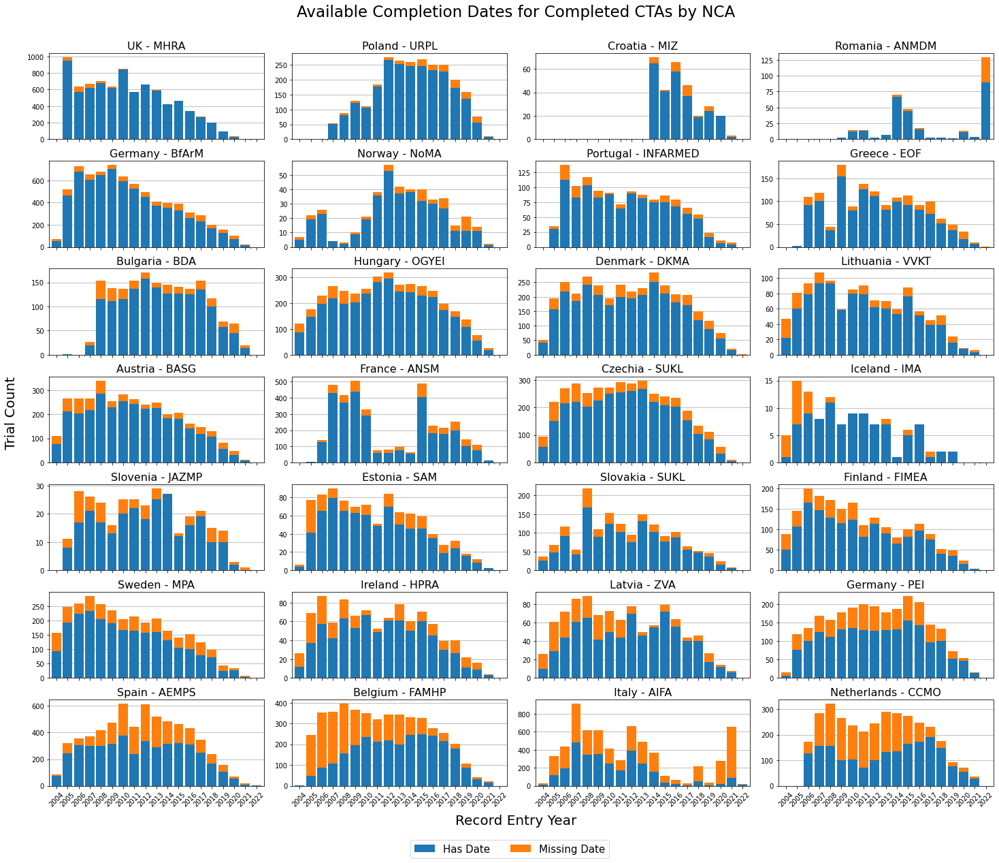

In [52]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4)
fig.suptitle("Available Completion Dates for Completed CTAs by NCA", y=1.02, fontsize=23)
fig.tight_layout()

for x, y in enumerate(fig.axes):
    stacked_dates.loc[[rankings_compdate.index[x]]].droplevel(level=0).T.plot.bar(stacked=True, ax=y, width=.85, 
                                                                            legend=False, sharex='col', rot=45)

    y.set_title(rankings_compdate.index[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(axis='y', zorder=0)
    y.set_xlabel('')
    
fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)
    
plt.legend(['Has Date', 'Missing Date'], 
           loc='lower center', ncol=5, bbox_to_anchor = (-1.25, -.9), fontsize=15)

plt.show()
#fig.savefig(parent + '/data/Figures/fig6.jpg', bbox_inches='tight', dpi=300)

# Trend in Results Availability by registration year

In [53]:
reporting_by_country = analysis_df[['eudract_number', 'nca', 'entered_year', 
                                    'approved_year', 'trial_results']].reset_index(drop=True)

reporting_by_country['results_dummy'] = np.where(reporting_by_country.trial_results == 'View results', 1, 0)

In [54]:
trial_reporting = reporting_by_country[['eudract_number', 'results_dummy']].groupby('eudract_number').sum()
trial_reporting = trial_reporting.join(reporting_by_country.groupby('eudract_number').count()[['nca']])
trial_reporting = trial_reporting.join(reporting_by_country[['eudract_number', 'entered_year']].groupby('eudract_number').max()[['entered_year']])
trial_reporting['results_dummy'] = np.where(trial_reporting.results_dummy > 0, 1, 0)

In [55]:
single_cta = trial_reporting[trial_reporting.nca == 1][['entered_year', 'results_dummy']].groupby('entered_year').agg(['sum', 'count'])
single_cta['reporting_prct'] = round((single_cta.results_dummy['sum'] / single_cta.results_dummy['count']) * 100, 2)

In [56]:
multi_cta = trial_reporting[trial_reporting.nca > 1][['entered_year', 'results_dummy']].groupby('entered_year').agg(['sum', 'count'])
multi_cta['reporting_prct'] = round((multi_cta.results_dummy['sum'] / multi_cta.results_dummy['count']) * 100, 2)

In [57]:
all_trial_reporting = trial_reporting[['entered_year', 'results_dummy']].groupby('entered_year').agg(['sum', 'count'])
all_trial_reporting['reporting_prct'] = round((all_trial_reporting.results_dummy['sum'] / all_trial_reporting.results_dummy['count']) * 100, 2)

In [58]:
print(len(trial_reporting[trial_reporting.nca == 1]))
print(len(trial_reporting[trial_reporting.nca > 1]))
print(len(trial_reporting))

25754
15489
41243


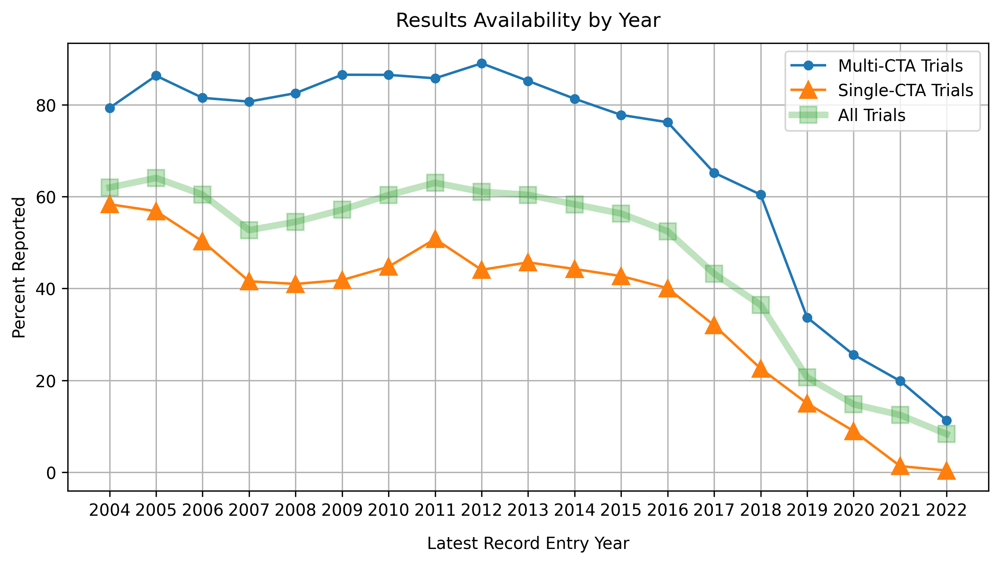

In [60]:
#Graphing the overall trend for single vs multiple CTA trials

fig, ax = plt.subplots(figsize = (10,5), dpi=300)

plt.plot(range(2004,2023), multi_cta['reporting_prct'], marker='.', markersize=10)
plt.plot(range(2004,2023), single_cta['reporting_prct'], marker='^', markersize=10)
plt.plot(range(2004,2023), all_trial_reporting['reporting_prct'], marker='s', markersize=10, lw=4, alpha=.3)

ax.set_xticks(range(2004,2023))

ax.legend(['Multi-CTA Trials', 'Single-CTA Trials', 'All Trials'], loc='upper right', fontsize=10)
ax.set_axisbelow(True)
ax.grid(zorder=0)

plt.ylabel('Percent Reported')
plt.xlabel('Latest Record Entry Year', labelpad=10)

plt.title('Results Availability by Year', pad=10)

plt.show()
#fig.savefig(parent + '/data/Figures/fig7.jpg', bbox_inches='tight', dpi=300)

In [61]:
eu_protocol_count= reporting_by_country.groupby('eudract_number').count()[['nca']].reset_index()

eu_protocol_count.columns = ['eudract_number', 'nca_count']

Creating data for trials with only a single CTA

In [62]:
solo_merge = reporting_by_country.merge(eu_protocol_count, how='left', on='eudract_number')

total = solo_merge[solo_merge.nca_count == 1][['nca', 'entered_year', 'results_dummy']].groupby(['nca', 'entered_year']).count().rename({'results_dummy': 'denominator'}, axis=1)

reported = solo_merge[solo_merge.nca_count == 1][['nca', 'entered_year', 'results_dummy']].groupby(['nca', 'entered_year']).sum().rename({'results_dummy': 'numerator'}, axis=1)

merged = total.join(reported)
merged['unreported'] = merged.denominator - merged.numerator

stacked = merged.drop('denominator', axis=1).stack().unstack(1)

Creating data for trials with multiple CTAs

In [63]:
multi_set = solo_merge[solo_merge.nca_count > 1][['eudract_number', 'results_dummy', 'entered_year']].drop_duplicates()

multi_group = multi_set.groupby('eudract_number', as_index=False).agg('min')[['entered_year', 'results_dummy']].groupby('entered_year').agg({'results_dummy':['count', 'sum']})['results_dummy']
multi_group['prct'] = round((multi_group['sum'] / multi_group['count']) * 100, 2)

Creating for all CTAs

In [64]:
single_cta_reporting = {}

for x in ordered_countries:
    d_r = stacked.loc[x].T.loc[2004:2016]
    num = d_r.numerator.sum()
    denom = num + d_r.unreported.sum()
    single_cta_reporting[x] = num / denom
    print(x, num, denom, num/denom, '\n')

rankings_reporting = pd.Series(single_cta_reporting).sort_values(ascending=False)
rankings_reporting

UK - MHRA 2408.0 3244.0 0.7422934648581998 

Italy - AIFA 613.0 2584.0 0.23722910216718265 

Spain - AEMPS 605.0 1949.0 0.310415597742432 

Germany - BfArM 1465.0 2278.0 0.6431079894644425 

France - ANSM 380.0 1508.0 0.2519893899204244 

Netherlands - CCMO 291.0 1541.0 0.18883841661258924 

Belgium - FAMHP 395.0 832.0 0.47475961538461536 

Hungary - OGYEI 131.0 235.0 0.5574468085106383 

Czechia - SUKL 118.0 253.0 0.466403162055336 

Denmark - DKMA 488.0 1028.0 0.47470817120622566 

Austria - BASG 529.0 815.0 0.649079754601227 

Sweden - MPA 223.0 786.0 0.2837150127226463 

Poland - URPL 73.0 107.0 0.6822429906542056 

Germany - PEI 383.0 539.0 0.7105751391465677 

Finland - FIMEA 142.0 527.0 0.269449715370019 

Bulgaria - BDA 72.0 102.0 0.7058823529411765 

Greece - EOF 52.0 111.0 0.46846846846846846 

Slovakia - SUKL 42.0 64.0 0.65625 

Portugal - INFARMED 20.0 48.0 0.4166666666666667 

Lithuania - VVKT 27.0 50.0 0.54 

Ireland - HPRA 54.0 158.0 0.34177215189873417 

Latvia - ZVA 29

Latvia - ZVA           0.783784
Croatia - MIZ          0.750000
UK - MHRA              0.742293
Germany - PEI          0.710575
Bulgaria - BDA         0.705882
Poland - URPL          0.682243
Romania - ANMDM        0.681818
Slovakia - SUKL        0.656250
Austria - BASG         0.649080
Germany - BfArM        0.643108
Estonia - SAM          0.604651
Hungary - OGYEI        0.557447
Lithuania - VVKT       0.540000
Belgium - FAMHP        0.474760
Denmark - DKMA         0.474708
Greece - EOF           0.468468
Czechia - SUKL         0.466403
Slovenia - JAZMP       0.461538
Portugal - INFARMED    0.416667
Ireland - HPRA         0.341772
Spain - AEMPS          0.310416
Sweden - MPA           0.283715
Iceland - IMA          0.270270
Finland - FIMEA        0.269450
France - ANSM          0.251989
Italy - AIFA           0.237229
Netherlands - CCMO     0.188838
Norway - NoMA          0.170370
dtype: float64

# Single CTAs for all NCAs...could turn this into lines as well potentially

fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4)
fig.suptitle("Proportion of Single-CTA Trials Reported by Year", y=1.02, fontsize=23)
fig.tight_layout()
for x, y in enumerate(fig.axes):
    stacked.loc[[rankings_reporting.index[x]]].droplevel(level=0).T.plot.bar(stacked=True, ax=y, width=.9, legend=False,
                                                                        sharex='col', rot=45)
    
    y.set_title(rankings_reporting.index[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(axis='y', zorder=0)
    y.set_xlabel('')

plt.legend(['Reported', 'Unreported'], 
           loc='lower center', ncol=5, bbox_to_anchor = (-1.25, -.9), fontsize=15)

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.show()
#fig.savefig(parent + '/data/Figures/fig8.jpg', bbox_inches='tight', dpi=300)